In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder

C:\Users\ATOnile\AppData\Local\Temp\ipykernel_9940\3459614673.py:8: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
C:\Users\ATOnile\AppData\Local\Temp\ipykernel_9940\3459614673.py:9: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


In [19]:
df = pd.read_csv(r"C:\Users\ATOnile\Downloads\healthcare_dataset.csv\healthcare_dataset.csv")

In [21]:
df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,eLIZABeTH jaCkSOn,42,Female,O+,Asthma,2020-08-16,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.714952,417,Elective,2020-09-15,Penicillin,Abnormal
55496,KYle pEREz,61,Female,AB-,Obesity,2020-01-23,Taylor Sullivan,Tucker-Moyer,Cigna,31457.797307,316,Elective,2020-02-01,Aspirin,Normal
55497,HEATher WaNG,38,Female,B+,Hypertension,2020-07-13,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.764717,347,Urgent,2020-08-10,Ibuprofen,Abnormal
55498,JENniFER JOneS,43,Male,O-,Arthritis,2019-05-25,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.092358,321,Elective,2019-05-31,Ibuprofen,Abnormal


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55500 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                55500 non-null  object 
 1   Age                 55500 non-null  int64  
 2   Gender              55500 non-null  object 
 3   Blood Type          55500 non-null  object 
 4   Medical Condition   55500 non-null  object 
 5   Date of Admission   55500 non-null  object 
 6   Doctor              55500 non-null  object 
 7   Hospital            55500 non-null  object 
 8   Insurance Provider  55500 non-null  object 
 9   Billing Amount      55500 non-null  float64
 10  Room Number         55500 non-null  int64  
 11  Admission Type      55500 non-null  object 
 12  Discharge Date      55500 non-null  object 
 13  Medication          55500 non-null  object 
 14  Test Results        55500 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.4

In [9]:
df.shape

(55500, 15)

In [691]:
duplicate = df[df.duplicated()]
duplicate

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
50023,Samuel joYCe,56,Male,O+,Arthritis,2022-11-03,Krista Hartman,Thomas-Ballard,UnitedHealthcare,15654.830587,157,Urgent,2022-11-22,Aspirin,Inconclusive
50040,KIMBErly vasqueZ,26,Male,A-,Obesity,2023-10-23,Jennifer Bennett,Cowan Inc,UnitedHealthcare,38142.109678,313,Urgent,2023-11-18,Penicillin,Abnormal
50055,SCoTT tHOrNton,55,Female,B-,Obesity,2021-04-08,Joshua Ingram,Keller LLC,Medicare,30894.904511,455,Urgent,2021-04-15,Aspirin,Abnormal
50070,wiLliam LEe,27,Female,O+,Arthritis,2020-01-31,Lauren Montgomery,Winters-Simon,Cigna,46229.434901,153,Elective,2020-02-13,Lipitor,Normal
50078,chRistOPheR NoRrIs,38,Male,AB-,Arthritis,2023-01-14,Denise Blair,Inc Morales,Medicare,9072.127142,452,Emergency,2023-02-12,Penicillin,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55461,connOR coMPTon,63,Male,A+,Asthma,2021-08-21,Jonathan Allen,"and Willis Mullins, Bowers",Medicare,1936.702824,375,Emergency,2021-09-16,Paracetamol,Normal
55462,alYSsA mIlLER,35,Female,A-,Diabetes,2022-06-30,Ryan Price,Shelton-Gallagher,UnitedHealthcare,2210.460898,289,Elective,2022-07-27,Penicillin,Normal
55464,ChRIs huGHeS,35,Female,AB-,Obesity,2024-02-28,Katelyn Perry,Lyons-Hansen,Blue Cross,11889.154513,128,Emergency,2024-03-14,Paracetamol,Abnormal
55484,keNNEtH alvarez,80,Male,O+,Cancer,2022-05-05,Andrew Conner,Sons Mayo and,Cigna,45653.802310,114,Elective,2022-05-17,Aspirin,Normal


In [693]:
duplicate.shape

(534, 15)

In [15]:
df.count()

Name                  55500
Age                   55500
Gender                55500
Blood Type            55500
Medical Condition     55500
Date of Admission     55500
Doctor                55500
Hospital              55500
Insurance Provider    55500
Billing Amount        55500
Room Number           55500
Admission Type        55500
Discharge Date        55500
Medication            55500
Test Results          55500
dtype: int64

In [709]:
df = df.drop_duplicates()
df

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,eLIZABeTH jaCkSOn,42,Female,O+,Asthma,2020-08-16,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.714952,417,Elective,2020-09-15,Penicillin,Abnormal
55496,KYle pEREz,61,Female,AB-,Obesity,2020-01-23,Taylor Sullivan,Tucker-Moyer,Cigna,31457.797307,316,Elective,2020-02-01,Aspirin,Normal
55497,HEATher WaNG,38,Female,B+,Hypertension,2020-07-13,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.764717,347,Urgent,2020-08-10,Ibuprofen,Abnormal
55498,JENniFER JOneS,43,Male,O-,Arthritis,2019-05-25,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.092358,321,Elective,2019-05-31,Ibuprofen,Abnormal


In [43]:
df.count()

Name                  54966
Age                   54966
Gender                54966
Blood Type            54966
Medical Condition     54966
Date of Admission     54966
Doctor                54966
Hospital              54966
Insurance Provider    54966
Billing Amount        54966
Room Number           54966
Admission Type        54966
Discharge Date        54966
Medication            54966
Test Results          54966
dtype: int64

In [45]:
df.isnull().sum()

Name                  0
Age                   0
Gender                0
Blood Type            0
Medical Condition     0
Date of Admission     0
Doctor                0
Hospital              0
Insurance Provider    0
Billing Amount        0
Room Number           0
Admission Type        0
Discharge Date        0
Medication            0
Test Results          0
dtype: int64

In [47]:
df.dtypes

Name                   object
Age                     int64
Gender                 object
Blood Type             object
Medical Condition      object
Date of Admission      object
Doctor                 object
Hospital               object
Insurance Provider     object
Billing Amount        float64
Room Number             int64
Admission Type         object
Discharge Date         object
Medication             object
Test Results           object
dtype: object

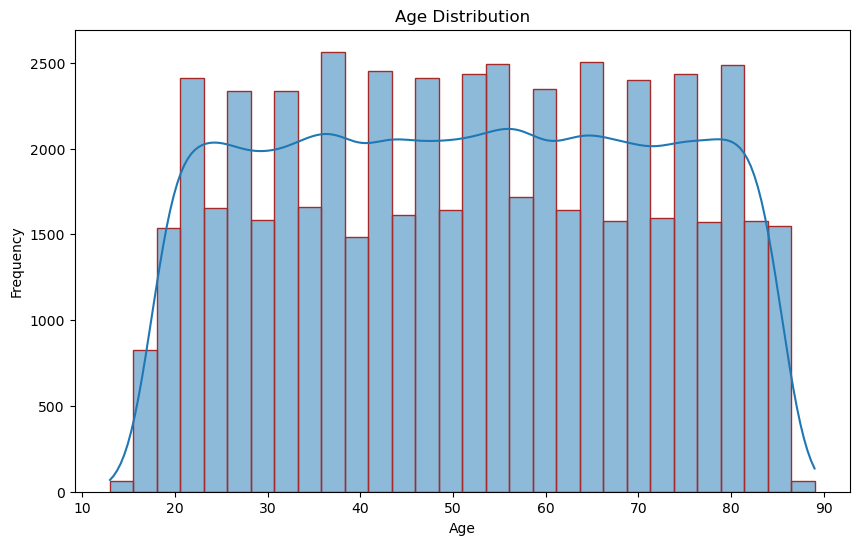

In [56]:
# visuilization 
plt.figure(figsize=(10, 6))
sns.histplot(df['Age'], bins = 30, kde = True, edgecolor = 'brown')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

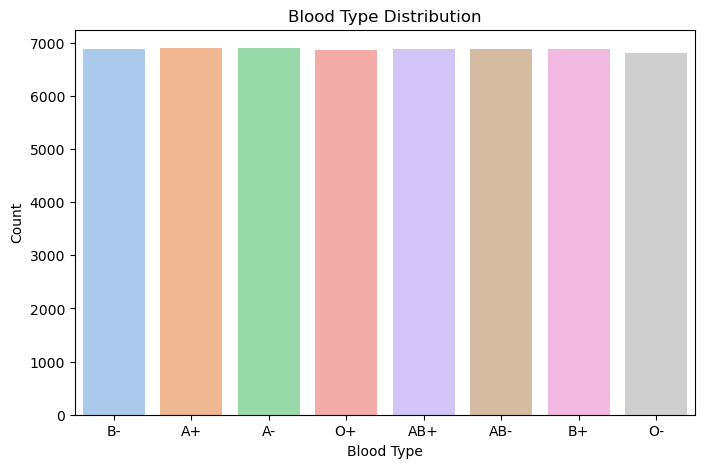

In [58]:
plt.figure(figsize=(8, 5))
sns.countplot(x='Blood Type', data=df, palette='pastel')
plt.title('Blood Type Distribution')
plt.xlabel('Blood Type')
plt.ylabel('Count')
plt.show()

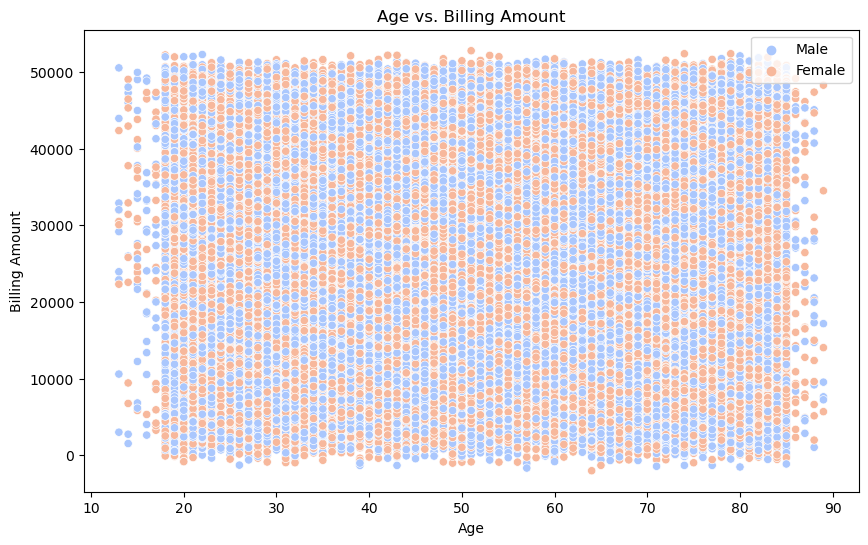

In [66]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x = 'Age', y = 'Billing Amount', data = df, hue='Gender', palette='coolwarm' )
plt.legend(loc = 'upper right')
plt.title('Age vs. Billing Amount')
plt.xlabel('Age')
plt.ylabel('Billing Amount')
plt.show()

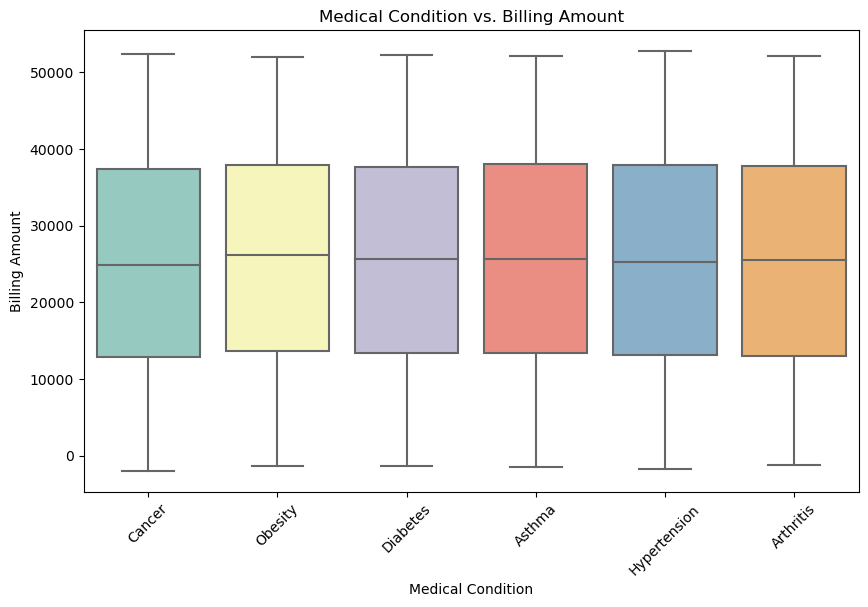

In [70]:
plt.figure(figsize=(10, 6))

sns.boxplot(x='Medical Condition', y='Billing Amount', data=df, palette='Set3')
plt.title('Medical Condition vs. Billing Amount')
plt.xlabel('Medical Condition')
plt.ylabel('Billing Amount')
plt.xticks(rotation=45)
plt.show()

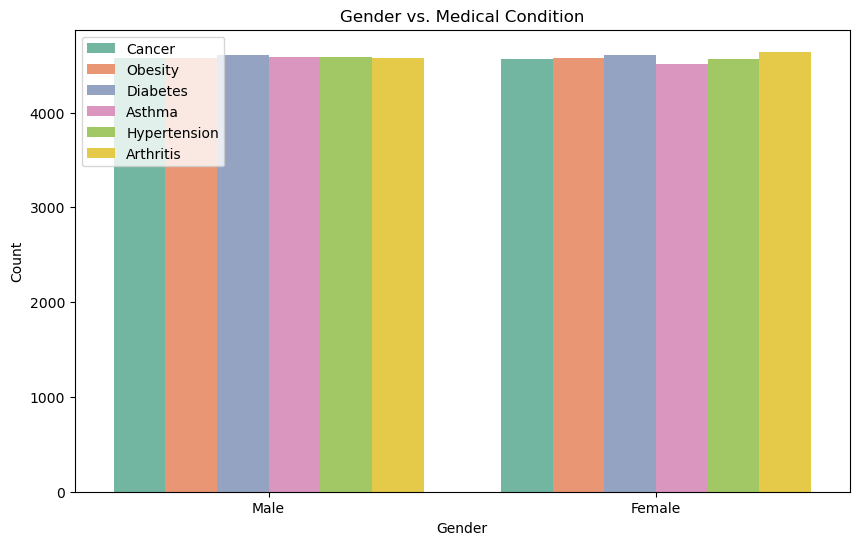

In [74]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Gender', hue='Medical Condition', data=df, palette='Set2')
plt.title('Gender vs. Medical Condition')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(loc = 'upper left')
plt.show() 

# week-5_TASK-2

In [12]:
numerical_column = df.select_dtypes(include = ['float64', 'int64'])
numerical_column 

,Age,Billing Amount,Room Number
0,30,18856.281306,328
1,62,33643.327287,265
2,76,27955.096079,205
3,28,37909.782410,450
4,43,14238.317814,458
...,...,...,...
55495,42,2650.714952,417
55496,61,31457.797307,316
55497,38,27620.764717,347
55498,43,32451.092358,321


In [41]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(numerical_column)
x_scaled

array([[-1.09882435, -0.47026116,  0.23311956],
       [ 0.53363905,  0.57025016, -0.31355599],
       [ 1.24784178,  0.16998976, -0.83419937],
       ...,
       [-0.6907085 ,  0.14646406,  0.39798996],
       [-0.43563609,  0.48635687,  0.17237783],
       [ 0.07450872, -1.51493121,  1.27440631]])

In [43]:
y = pd.DataFrame(x_scaled)
y

,0,1,2
0,-1.098824,-0.470261,0.233120
1,0.533639,0.570250,-0.313556
2,1.247842,0.169990,-0.834199
3,-1.200853,0.870465,1.291761
4,-0.435636,-0.795211,1.361180
...,...,...,...
55495,-0.486651,-1.610589,1.005407
55496,0.482625,0.416462,0.128991
55497,-0.690708,0.146464,0.397990
55498,-0.435636,0.486357,0.172378


In [66]:
# APP;Y PCA 
pca = PCA(n_components=3)
x_pca = pca.fit_transform(y)
x_pca

array([[ 0.18145022,  0.86810253, -0.83449329],
       [ 0.23973625, -0.59476542,  0.54502648],
       [-0.2510549 , -1.42451401,  0.43546008],
       ...,
       [ 0.33966329,  0.72810522, -0.10685315],
       [ 0.53291249,  0.38083152,  0.16433978],
       [-1.64480768,  1.03013564, -0.39762776]])

In [138]:
print(pca.explained_variance_ratio_)
# Eigenvalues (explained variance ratio)
eigenvalues = pca.explained_variance_

# Eigenvectors (principal components)
eigenvectors = pca.components_

# Print the eigenvalues
print("Eigenvalues:")
print(eigenvalues)

# Print the eigenvectors
print("Eigenvectors:")
print(eigenvectors)

[0.33483344 0.33356492 0.33160164]
Eigenvalues:
[1.00451843 1.00071278 0.99482285]
Eigenvectors:
[[-0.5605429   0.73133579 -0.38850947]
 [-0.6039996  -0.0400961   0.79597537]
 [ 0.56654756  0.68083791  0.46420211]]


In [142]:
# Calculate the covariance matrix
covariance_matrix = np.cov(x_pca.T)
covariance_matrix

array([[ 1.00451843e+00, -5.68636473e-16, -1.41326936e-16],
       [-5.68636473e-16,  1.00071278e+00,  2.21232427e-16],
       [-1.41326936e-16,  2.21232427e-16,  9.94822851e-01]])

In [144]:
# Compute eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

# Print the eigenvalues and eigenvectors
print("Eigenvalues:")
print(eigenvalues)

print("Eigenvectors:")
print(eigenvectors)

Eigenvalues:
[1.00451843 1.00071278 0.99482285]
Eigenvectors:
[[-1.00000000e+00  1.49419082e-13  1.45764358e-14]
 [ 9.42775608e-14  1.00000000e+00 -3.03333601e-14]
 [ 1.45764358e-14  4.91828800e-14  1.00000000e+00]]


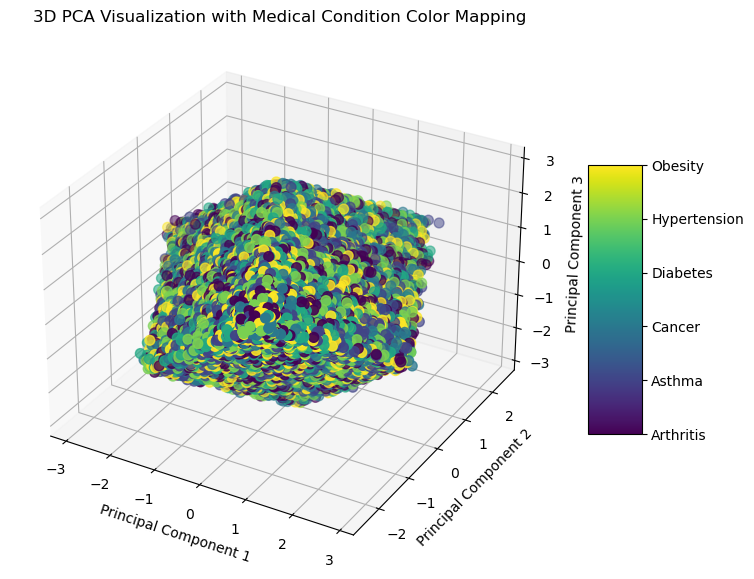

In [156]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
color_labels = le.fit_transform(df['Medical Condition'])
color_labels 
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with color mapping based on 'Medical Condition'
scatter = ax.scatter(x_pca[:, 0], x_pca[:, 1], x_pca[:, 2], c=color_labels, cmap='viridis', s=50)
# Adding a color bar to understand the mapping
colorbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
colorbar.set_ticks(range(len(le.classes_)))
colorbar.set_ticklabels(le.classes_)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA Visualization with Medical Condition Color Mapping' )
# Save the plot as a PNG file

plt.savefig('3D_PCA_Visualization_with_Medical_Condition_Color_Mapping.png', dpi=300)

plt.show()


# week-5_TASK-3

In [7]:
app = dash.Dash(__name__)

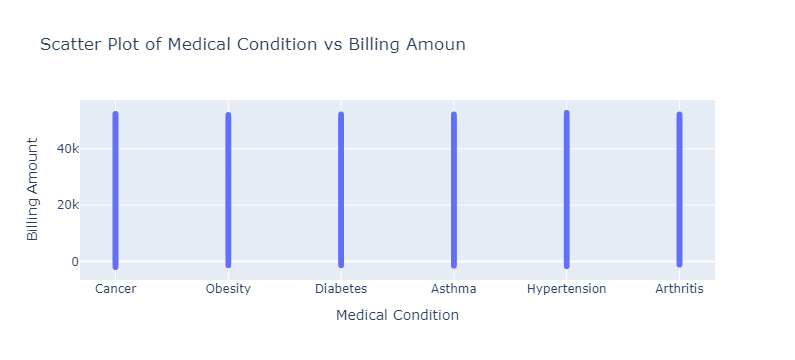

In [43]:
fig1 = px.scatter(df, x = 'Medical Condition', y = 'Billing Amount', title = 'Scatter Plot of Medical Condition vs Billing Amoun')
fig1 

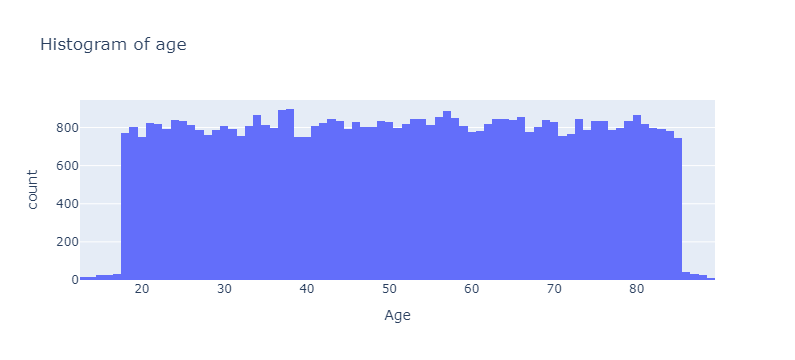

In [87]:
fig2 = px.histogram(df,x = 'Age',title='Histogram of age')
fig2

In [23]:
# Initialize the Dash app
app = dash.Dash(__name__)

# Define the layout
app.layout = html.Div([
    html.H1("EDA Dashboard", style={'textAlign': 'center'}),

    html.Label('X-Axis:'),
    dcc.Dropdown(
        id='x-axis-dropdown',
        options=[{'label': col, 'value': col} for col in df.columns],
        value=df.columns[0],
        clearable=False
    ),

    html.Label('Y-Axis:'),
    dcc.Dropdown(
        id='y-axis-dropdown',
        options=[{'label': col, 'value': col} for col in df.columns],
        value=df.columns[1],
        clearable=False
    ),

    dcc.Graph(id='scatter-plot'),

    html.Label('Histogram Column:'),
    dcc.Dropdown(
        id='histogram-dropdown',
        options=[{'label': col, 'value': col} for col in df.columns],
        value=df.columns[2],
        clearable=False
    ),

    dcc.Graph(id='histogram'),

    html.Label('Bar Chart Column:'),
    dcc.Dropdown(
        id='bar-chart-dropdown',
        options=[{'label': col, 'value': col} for col in df.columns],
        value=df.columns[3],
        clearable=False
    ),

    dcc.Graph(id='bar-chart')
])

# Scatter Plot Callback
@app.callback(
    Output('scatter-plot', 'figure'),
    Input('x-axis-dropdown', 'value'),
    Input('y-axis-dropdown', 'value')
)
def update_scatter_plot(x_axis, y_axis):
    fig = px.scatter(df, x=x_axis, y=y_axis, title=f'Scatter Plot: {x_axis} vs {y_axis}')
    return fig

# Histogram Callback
@app.callback(
    Output('histogram', 'figure'),
    Input('histogram-dropdown', 'value')
)
def update_histogram(column):
    fig = px.histogram(df, x=column, title=f'Histogram of {column}')
    return fig

# Bar Chart Callback
@app.callback(
    Output('bar-chart', 'figure'),
    Input('bar-chart-dropdown', 'value')
)
def update_bar_chart(column):
    fig = px.bar(df, x=column, y=df[column].value_counts().index, title=f'Bar Chart of {column}')
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

In [15]:
if __name__ == '__main__':
    app.run_server(port=8040)

In [759]:
df.drop(columns = ['Name','Doctor','Hospital','Date of Admission','Discharge Date', 'Room Number'], axis = 1,inplace = True)

In [761]:
df.head(2)

,Age,Gender,Blood Type,Medical Condition,Insurance Provider,Billing Amount,Admission Type,Medication,Test Results
0,30,Male,B-,Cancer,Blue Cross,18856.281306,Urgent,Paracetamol,Normal
1,62,Male,A+,Obesity,Medicare,33643.327287,Emergency,Ibuprofen,Inconclusive


In [763]:
df.shape

(55500, 9)

In [765]:
df.head(2)

,Age,Gender,Blood Type,Medical Condition,Insurance Provider,Billing Amount,Admission Type,Medication,Test Results
0,30,Male,B-,Cancer,Blue Cross,18856.281306,Urgent,Paracetamol,Normal
1,62,Male,A+,Obesity,Medicare,33643.327287,Emergency,Ibuprofen,Inconclusive


In [767]:
label_encoders = {}
categorical_columns = ['Blood Type','Gender','Medical Condition', 'Insurance Provider', 'Admission Type', 'Medication', 'Test Results']

# Apply Label Encoding to each categorical column
for col in categorical_columns:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])
    label_encoders[col] = le

# Drop original categorical columns if needed
df_encoded = df.drop(columns=categorical_columns)

# Display the resulting DataFrame
df_encoded

,Age,Billing Amount,Blood Type_encoded,Gender_encoded,Medical Condition_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
0,30,18856.281306,5,1,2,1,2,3,2
1,62,33643.327287,0,1,5,3,1,1,1
2,76,27955.096079,1,0,5,0,1,0,2
3,28,37909.782410,6,0,3,3,0,1,0
4,43,14238.317814,2,0,2,0,2,4,0
...,...,...,...,...,...,...,...,...,...
55495,42,2650.714952,6,0,1,1,0,4,0
55496,61,31457.797307,3,0,5,2,0,0,2
55497,38,27620.764717,4,0,4,4,2,1,0
55498,43,32451.092358,7,1,0,3,0,1,0


In [769]:
 # values of categorical
x = df_encoded.drop('Billing Amount', axis = 1)
x

,Age,Blood Type_encoded,Gender_encoded,Medical Condition_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
0,30,5,1,2,1,2,3,2
1,62,0,1,5,3,1,1,1
2,76,1,0,5,0,1,0,2
3,28,6,0,3,3,0,1,0
4,43,2,0,2,0,2,4,0
...,...,...,...,...,...,...,...,...
55495,42,6,0,1,1,0,4,0
55496,61,3,0,5,2,0,0,2
55497,38,4,0,4,4,2,1,0
55498,43,7,1,0,3,0,1,0


In [647]:

X = df_encoded.drop('Billing Amount', axis=1)
X 


,Age,Gender,Medical Condition,Gender_encode,Blood Type_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
0,30,1,Cancer,1,5,1,2,3,2
1,62,1,Obesity,1,0,3,1,1,1
2,76,0,Obesity,0,1,0,1,0,2
3,28,0,Diabetes,0,6,3,0,1,0
4,43,0,Cancer,0,2,0,2,4,0
...,...,...,...,...,...,...,...,...,...
55495,42,0,Asthma,0,6,1,0,4,0
55496,61,0,Obesity,0,3,2,0,0,2
55497,38,0,Hypertension,0,4,4,2,1,0
55498,43,1,Arthritis,1,7,3,0,1,0


In [771]:
y = df_encoded['Billing Amount']
y

0        18856.281306
1        33643.327287
2        27955.096079
3        37909.782410
4        14238.317814
             ...     
55495     2650.714952
55496    31457.797307
55497    27620.764717
55498    32451.092358
55499     4010.134172
Name: Billing Amount, Length: 55500, dtype: float64

In [651]:
q1 = df['Billing Amount'].quantile(0.25)
q1


13241.224652365136

In [653]:
q3 = df['Billing Amount'].quantile(0.75)
q3

37820.508435784795

In [655]:
IQR = q3-q1
IQR 

24579.28378341966

In [657]:
upper_bound = q3+1.5*IQR
upper_bound

74689.43411091428

In [659]:
lower_bound = q1-1.5*IQR
lower_bound

-23627.701022764355

In [813]:
# to remove outliers fron data set
df_encoded[(df_encoded['Billing Amount']>= lower_bound)&(df_encoded['Billing Amount']<=upper_bound)]

,Age,Billing Amount,Blood Type_encoded,Gender_encoded,Medical Condition_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
0,30,18856.281306,5,1,2,1,2,3,2
1,62,33643.327287,0,1,5,3,1,1,1
2,76,27955.096079,1,0,5,0,1,0,2
3,28,37909.782410,6,0,3,3,0,1,0
4,43,14238.317814,2,0,2,0,2,4,0
...,...,...,...,...,...,...,...,...,...
55495,42,2650.714952,6,0,1,1,0,4,0
55496,61,31457.797307,3,0,5,2,0,0,2
55497,38,27620.764717,4,0,4,4,2,1,0
55498,43,32451.092358,7,1,0,3,0,1,0


In [825]:
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)
X_train

,Age,Blood Type_encoded,Gender_encoded,Medical Condition_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
45174,22,6,0,0,0,0,1,0
10214,22,5,1,3,1,1,3,2
43199,81,0,0,0,4,1,3,0
31626,80,4,0,1,1,0,3,2
9273,26,2,0,5,4,0,1,1
...,...,...,...,...,...,...,...,...
44732,27,5,0,2,2,0,3,1
54343,32,3,1,4,4,1,4,2
38158,24,5,0,5,4,1,2,1
860,76,0,1,1,0,1,0,0


In [777]:
df.shape

(55500, 16)

In [819]:
X_train.shape


(44400, 9)

In [815]:
X_test.shape

(11100, 9)

In [783]:
y_train.shape

(44400,)

In [817]:
y_test.shape

(11100,)

In [827]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
 

In [821]:
# Modeling and Prediction
model = LinearRegression()
model

LinearRegression()

In [829]:
model.fit(X_train,y_train)
y_predict = model.predict(X_train)
y_predict

array([25545.34241441, 25701.85100178, 25104.30439856, ...,
       25757.5874501 , 25537.55027371, 25657.63669662])

In [793]:
mse = mean_squared_error(y_train, y_predict)
r2 = r2_score(y_train,y_predict)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 202674694.59981084
R-squared: 0.0002281106740331662


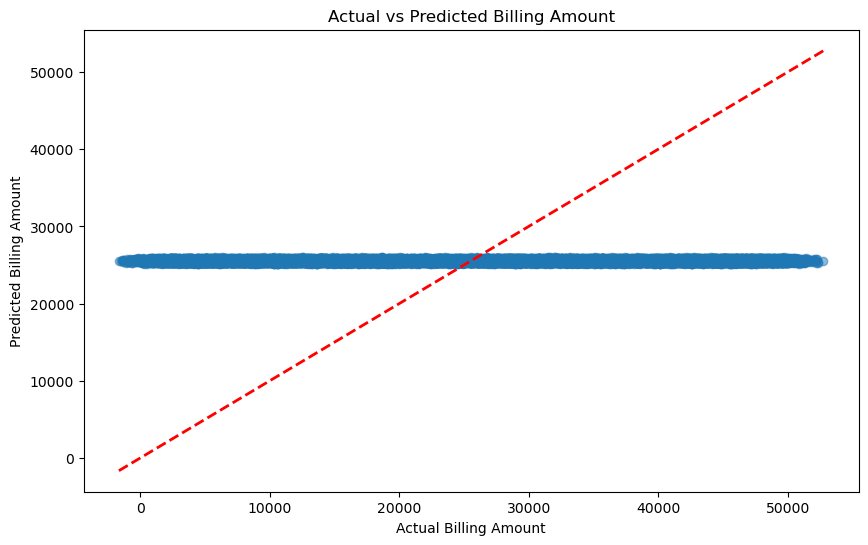

In [749]:
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_predict, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Billing Amount')
plt.ylabel('Predicted Billing Amount')
plt.title('Actual vs Predicted Billing Amount')
plt.show()

In [407]:
https://github.com/wasaf-amna/task-5.git

SyntaxError: invalid decimal literal (2953453577.py, line 1)

In [385]:
# Sample healthcare dataset
data = {
    'Age': [23, 45, 56, 32, 41, 52, 35, 29, 61, 48],
    'Gender': ['Male', 'Female', 'Female', 'Male', 'Female', 'Male', 'Male', 'Female', 'Male', 'Female'],
    'Type of Treatment': ['Surgery', 'Therapy', 'Medication', 'Therapy', 'Surgery', 'Surgery', 'Therapy', 'Medication', 'Surgery', 'Therapy'],
    'Ward': ['General', 'Private', 'ICU', 'General', 'ICU', 'Private', 'General', 'ICU', 'Private', 'General'],
    'Billing Amount': [1200, 4500, 3500, 2000, 3100, 4200, 1900, 2800, 4300, 2200]
}

df = pd.DataFrame(data)

In [795]:
df

,Age,Gender,Blood Type,Medical Condition,Insurance Provider,Billing Amount,Admission Type,Medication,Test Results,Blood Type_encoded,Gender_encoded,Medical Condition_encoded,Insurance Provider_encoded,Admission Type_encoded,Medication_encoded,Test Results_encoded
0,30,Male,B-,Cancer,Blue Cross,18856.281306,Urgent,Paracetamol,Normal,5,1,2,1,2,3,2
1,62,Male,A+,Obesity,Medicare,33643.327287,Emergency,Ibuprofen,Inconclusive,0,1,5,3,1,1,1
2,76,Female,A-,Obesity,Aetna,27955.096079,Emergency,Aspirin,Normal,1,0,5,0,1,0,2
3,28,Female,O+,Diabetes,Medicare,37909.782410,Elective,Ibuprofen,Abnormal,6,0,3,3,0,1,0
4,43,Female,AB+,Cancer,Aetna,14238.317814,Urgent,Penicillin,Abnormal,2,0,2,0,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,42,Female,O+,Asthma,Blue Cross,2650.714952,Elective,Penicillin,Abnormal,6,0,1,1,0,4,0
55496,61,Female,AB-,Obesity,Cigna,31457.797307,Elective,Aspirin,Normal,3,0,5,2,0,0,2
55497,38,Female,B+,Hypertension,UnitedHealthcare,27620.764717,Urgent,Ibuprofen,Abnormal,4,0,4,4,2,1,0
55498,43,Male,O-,Arthritis,Medicare,32451.092358,Elective,Ibuprofen,Abnormal,7,1,0,3,0,1,0


In [393]:
# Initialize LabelEncoder
labelencoder = LabelEncoder()

# Apply LabelEncoder to 'Gender'
df['Gender'] = labelencoder.fit_transform(df['Gender'])

# Display the DataFrame
print("DataFrame with Label Encoded 'Gender':")
print(df)


DataFrame with Label Encoded 'Gender':
   Age  Gender Type of Treatment     Ward  Billing Amount
0   23       1           Surgery  General            1200
1   45       0           Therapy  Private            4500
2   56       0        Medication      ICU            3500
3   32       1           Therapy  General            2000
4   41       0           Surgery      ICU            3100
5   52       1           Surgery  Private            4200
6   35       1           Therapy  General            1900
7   29       0        Medication      ICU            2800
8   61       1           Surgery  Private            4300
9   48       0           Therapy  General            2200


In [397]:
# Initialize OneHotEncoder
onehotencoder = OneHotEncoder(sparse_output=False, drop='first')

# Apply OneHotEncoder to 'Type of Treatment' and 'Ward'
categorical_features = df[['Type of Treatment', 'Ward']]
encoded_features = onehotencoder.fit_transform(categorical_features)

# Convert to DataFrame and assign column names
encoded_df = pd.DataFrame(encoded_features, columns=onehotencoder.get_feature_names_out(['Type of Treatment', 'Ward']))

# Concatenate the encoded features with the original DataFrame (excluding the original categorical columns)
df_encoded = pd.concat([df.drop(['Type of Treatment', 'Ward'], axis=1), encoded_df], axis=1)

df_encoded

,Age,Gender,Billing Amount,Type of Treatment_Surgery,Type of Treatment_Therapy,Ward_ICU,Ward_Private
0,23,1,1200,1.0,0.0,0.0,0.0
1,45,0,4500,0.0,1.0,0.0,1.0
2,56,0,3500,0.0,0.0,1.0,0.0
3,32,1,2000,0.0,1.0,0.0,0.0
4,41,0,3100,1.0,0.0,1.0,0.0
5,52,1,4200,1.0,0.0,0.0,1.0
6,35,1,1900,0.0,1.0,0.0,0.0
7,29,0,2800,0.0,0.0,1.0,0.0
8,61,1,4300,1.0,0.0,0.0,1.0
9,48,0,2200,0.0,1.0,0.0,0.0


In [399]:
# Define features (X) and target (y)
X = df_encoded.drop('Billing Amount', axis=1)  # Independent variables
y = df_encoded['Billing Amount']  # Dependent variable

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [401]:
# Initialize the model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred

array([4426.82926829, 4393.49593496])

In [403]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 13714.389582919554
R-squared: -0.3714389582919553


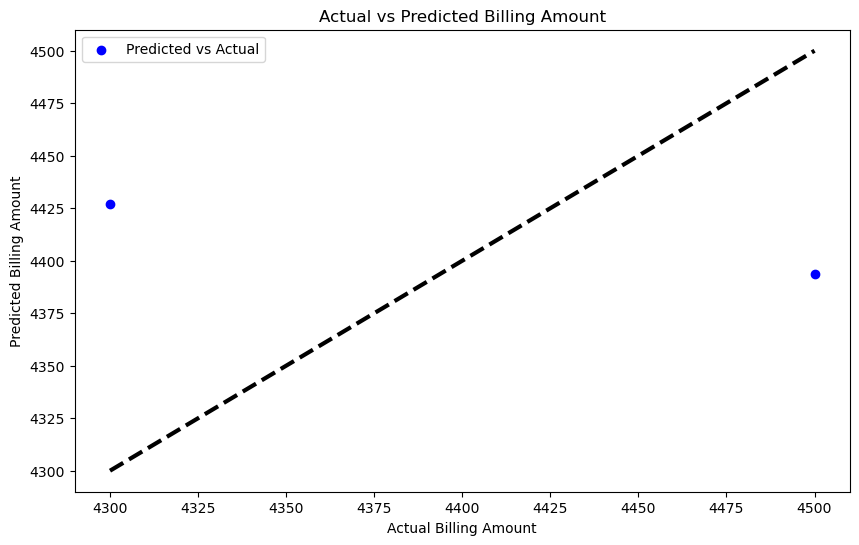

In [405]:
# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3)
plt.xlabel('Actual Billing Amount')
plt.ylabel('Predicted Billing Amount')
plt.title('Actual vs Predicted Billing Amount')
plt.legend()
plt.show()